<a href="https://colab.research.google.com/github/debsdamaso/AI/blob/main/Sprint3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <span style="color:#9B59B6"> Apresentação do Projeto Bike Check</span>


# <span style="color:#9B59B6"> 1. Sumário </span> <a class="ancora" id="sumario_1"></a>

A Bike Check é uma equipe de alunos de Análise e Desenvolvimento de Sistemas da FIAP, que procura desenvolver soluções tecnológicas para facilitar o processo de vistoria online de bicicletas realizado para a empresa Porto Seguros.


# <span style="color:#9B59B6">  2. Etapa de Perguntas do Negócio </span>  

### 2.1 Tarefa de Negócio

Na etapa atual de desenvolvimento deste projeto (Sprint 3), a finalidade presente é separar imagens de bicicleta para um treinamento futuro de um modelo de aprendizado de máquina utilizando reconhecimento de imagens, que deverá reconhecer se realmente existe ou não existe uma bicicleta em uma foto enviada pelo usuário no momento de contratação de seguro de bicicletas, deste modo será possível evitar fraudes no momento da contratação. Este modelo será desenvolvido, implementado e aprimorado na próxima fase do Challenge (Sprint 4).

Para isto, 2 datasets serão utilizados como apoio, um que se trata de uma base de imagens de bicicletas que serão utlizadas para treinar a IA para reconhecer a existência ou não de uma bicicleta na foto, e o segundo dataset se trata de dados de vendas de bicicletas realizados em uma loja de bicicletas, que podem auxiliar ao dar um norte em relação à algumas perguntas que poderão ser feitas futuramente, como por exemplo, sobre quais tipos de bicicletas são mais vendidos. Uma pequena e breve análise sobre o segundo dataset foi realizada para demonstração.


## <span style="color:#9B59B6"> 3. Etapa de Preparação

#### 3.1 Datasets utilizados:
Ambos datasets foram retirados do site Kaggle.
* A) A fonte de dados que será utilizada para o treinamento de imagens da IA se trata de um dataset com a quantidade de 10.052 imagens de bicicletas, e com a qualidade de 9.41 de usabilidade no Kaggle.
* B) A fonte de dados usada para nossa breve análise de dados são os dados de vendas de bicicletas realizados em uma loja de bicicletas, com usabilidade de 9.71 de acordo com o Kaggle.

#### 3.2 Acessibilidade e privacidade dos dados:

* A) Os dados do dataset da imagens de bicicletas foram disponibilizados no site Kaggle <a href="https://creativecommons.org/publicdomain/zero/1.0/">sob esta licença</a>.
* B) Os dados do dataset da loja de bicicletas foram disponibilizados no site Kaggle <a href="https://www.gnu.org/licenses/old-licenses/gpl-2.0.en.html">sob esta licença</a>.


#### 3.2 Organização e Verificação dos Dados:
* A) Do <a href="https://www.kaggle.com/datasets/tysonpo/bike-ads-images-prices-specifications?select=images">dataset de imagens de bicicletas</a> foi utilizada uma pasta inteira "images" que contém 10.052 imagens. Esta pasta está dentro da pasta "archive.zip" baixada no site. A pasta images foi carregada dentro diretório de estudos na forma zip para facilitar o tamanho do documento.

* B) Foi extraído do <a href="https://www.kaggle.com/datasets/rohitsahoo/bicycle-store-dataset?select=Transactions.csv">dataset da loja de bicicletas</a> o arquivo "Transactions.csv" para dentro desta pasta, no qual contém informações que serão relevantes neste estudo: como marcas vendidas (brand), tipos de bikes (product line), tamanho do produto (product size), entre outros.



# <span style="color:#9B59B6">  4. Etapa de Processamento</span>

Este estudo foi realizado em python devido à acessibilidade, qualidade de processamento e também ao conhecimento maior na linguagem.

### 4.1 Pacotes e bibliotecas instaladas

No momento, usaremos os seguintes pacotes para realizar a análise:

* pandas
* zipfile
* random
* os
* image, de PIL

In [33]:
import pandas as pd
import zipfile
import random
import os
from PIL import Image

# <span style="color:#9B59B6">  5. Ínicio da etapa de preparação dos dados: Dataset da loja</span>

* Será realizada uma Análise de Dados breve das Vendas da loja de bicicletas.

Nessa etapa irei fazer algumas visualizações iniciais,procurando por valores duplicados e nulos, removendo linhas que serão desnecessárias para a analise.

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Sprint3/Transactions.csv')

In [ ]:
df.head()

,transaction_id,product_id,customer_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,...,Unnamed: 246,Unnamed: 247,Unnamed: 248,Unnamed: 249,Unnamed: 250,Unnamed: 251,Unnamed: 252,Unnamed: 253,Unnamed: 254,Unnamed: 255
0,1,2,2950,25-02-2017,False,Approved,Solex,Standard,medium,medium,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,3,3120,21-05-2017,True,Approved,Trek Bicycles,Standard,medium,large,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,37,402,16-10-2017,False,Approved,OHM Cycles,Standard,low,medium,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,88,3135,31-08-2017,False,Approved,Norco Bicycles,Standard,medium,medium,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,78,787,01-10-2017,True,Approved,Giant Bicycles,Standard,medium,large,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Columns: 256 entries, transaction_id to Unnamed: 255
dtypes: float64(245), int64(3), object(8)
memory usage: 39.1+ MB


In [ ]:
# Checar a quantidade de números nulos (NaN)

df.isnull().sum()

transaction_id          0
product_id              0
customer_id             0
transaction_date        0
online_order          360
                    ...  
Unnamed: 251        20000
Unnamed: 252        20000
Unnamed: 253        20000
Unnamed: 254        20000
Unnamed: 255        20000
Length: 256, dtype: int64

In [ ]:
# Deletar os registros com multiplos NaN.

df = df.dropna(thresh=8)
df.isnull().sum()

transaction_id          0
product_id              0
customer_id             0
transaction_date        0
online_order          358
                    ...  
Unnamed: 251        19803
Unnamed: 252        19803
Unnamed: 253        19803
Unnamed: 254        19803
Unnamed: 255        19803
Length: 256, dtype: int64

# <span style="color:#9B59B6">  6. Perguntas importantes do Data Understanding</span>

* 1) Quais marcas de bicicletas que são vendidas? Qual a quantidade de cada?
* 2) Quais os tipos de bicicletas? Qual a quantidade de cada?


In [ ]:
# Tipos unicos de marcas
marcas = df['brand'].unique()
print("As marcas únicas são:")
print(marcas)

# contagem
contagem_marcas = df['brand'].value_counts()
print("\nA contagem da quantidade por marcas é:")
print(contagem_marcas)

# Tipos unicos de bike
tipo_bike = df['product_line'].unique()
print("Os tipos de bicicleta são:")
print(tipo_bike)

# contagem
contagem_tipos = df['product_line'].value_counts()
print("\nA contagem dos tipos de bicicleta mais comprados é:")
print(contagem_tipos)


As marcas únicas são:
['Solex' 'Trek Bicycles' 'OHM Cycles' 'Norco Bicycles' 'Giant Bicycles'
 'WeareA2B']

A contagem da quantidade por marcas é:
Solex             4253
Giant Bicycles    3312
WeareA2B          3295
OHM Cycles        3043
Trek Bicycles     2990
Norco Bicycles    2910
Name: brand, dtype: int64
Os tipos de bicicleta são:
['Standard' 'Road' 'Mountain' 'Touring']

A contagem dos tipos de bicicleta mais comprados é:
Standard    14176
Road         3970
Touring      1234
Mountain      423
Name: product_line, dtype: int64


# <span style="color:#9B59B6">  7. Conclusões sobre a análise do dataset da loja </span>

Estas informações poderão servir de apoio para perguntas futuras durante o treinamento da IA. Como por exemplo: ao checar os tipos de bicicletas mais vendidos, nota-se que a diferença de quantidades de tipos vendidos entre o primeiro lugar (Standard, com 14.176 vendas) e o ultimo lugar (Mountain, com 423 vendas) é bastante significativa. Em relação ao reconhecimento de imagens, esta informação pode ser usada como exemplo para dar um norte em relação à quais imagens devem ser carregadas por ordem de prioridade e quantidades.

# <span style="color:#9B59B6">  8. Breve demonstração do dataset de imagens de bicicleta</span>

Nesta etapa, serão exibidas uma amostra de 100 imagens aleatórias que estão entre as  10 mil imagens do dataset de imagens de bicicleta da pasta zipada images, apenas como um demonstrativo do que será utilizado futuramente na próxima fase (Sprint 4).


### 8.1 Extração da pasta zip

In [22]:
# Caminho para o arquivo ZIP que será extraído
caminho_arquivo_zip = "/content/drive/MyDrive/Colab Notebooks/Sprint3/images.zip"

# Pasta de destino para a amostra de imagens
pasta_destino_amostra = "/content/drive/MyDrive/Colab Notebooks/Sprint3/amostra_imagens"

# Criar a pasta de destino
os.makedirs(pasta_destino_amostra, exist_ok=True)

# Abrir o arquivo ZIP
with zipfile.ZipFile(caminho_arquivo_zip, 'r') as zip_ref:
    # Listar todos os nomes dos arquivos no ZIP
    nomes_arquivos = zip_ref.namelist()

    # Selecionar aleatoriamente 100 imagens
    amostra_imagens = random.sample(nomes_arquivos, 100)

    # Extrair as imagens da amostra para a pasta de destino
    for arquivo in amostra_imagens:
        zip_ref.extract(arquivo, pasta_destino_amostra)

# Agora, a amostra de 100 imagens está na pasta de destino especificada


### 8.2 Exibição das 100 imagens aleatórias

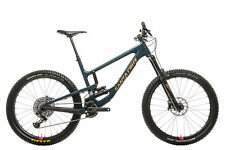

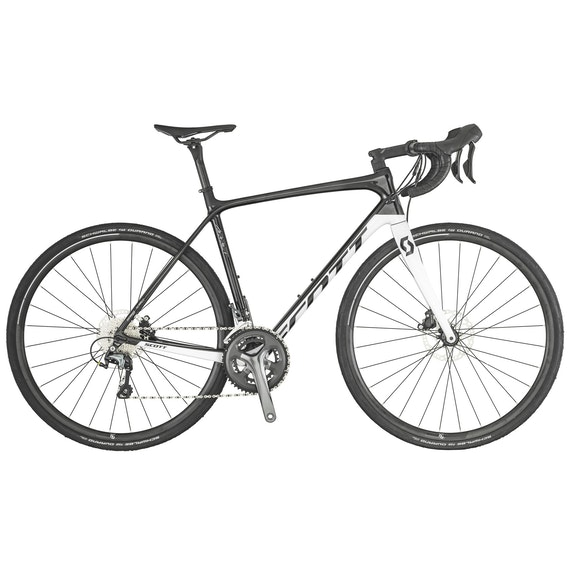

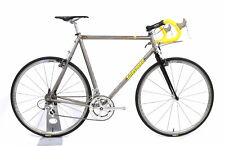

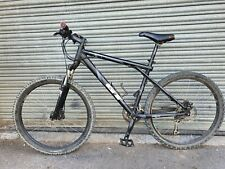

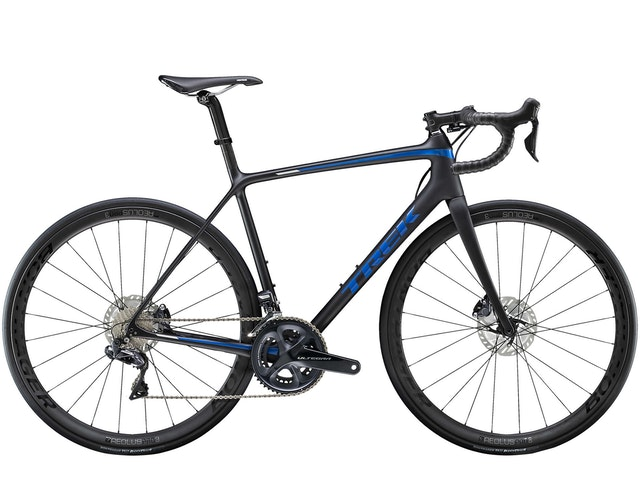

...

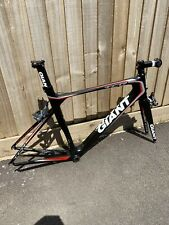

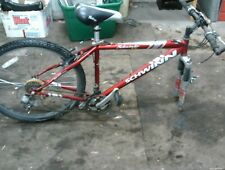

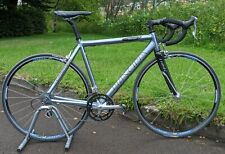

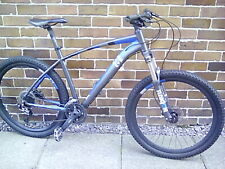

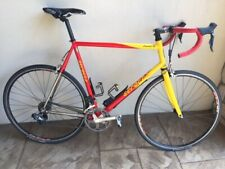

In [32]:
# Pasta onde as imagens foram extraídas
pasta_destino_amostra = "/content/drive/MyDrive/Colab Notebooks/Sprint3/amostra_imagens/images"

# Listar os nomes dos arquivos na pasta de amostra
nomes_arquivos_amostra = os.listdir(pasta_destino_amostra)

# Exibir cada imagem na amostra
for nome_arquivo in nomes_arquivos_amostra:
    caminho_arquivo = os.path.join(pasta_destino_amostra, nome_arquivo)

    # Verificar se o item é um arquivo
    if os.path.isfile(caminho_arquivo):
        img = Image.open(caminho_arquivo)
        display(img)
